# **Food Business Performance, Violation and Inspection Results Analysis:**

## **Business Context**


*Client Company:* The client for this project is a municipal regulatory agency that oversees health and safety inspections of local businesses in Chicago. This includes restaurants, schools, grocery stores, and other food-related establishments.

*Data Information:* They have collected data from inspection reports, which encompasses various attributes such as business names, violation types, facility types, inspection dates, and risk levels.

*Need for Data Scientist:* The regulatory agency needs insights from this data to identify trends in business performance, pinpoint areas that need intervention, and provide reports to stakeholders. Finding correlations between facility types and violations can help improve overall community health and inform decisions about future inspections and support for at-risk businesses.

### **Data Exploration**


**Characteristics of the Dataset:**

The dataset includes 14 columns that describe various business attributes and inspection results. Key columns relevant to our analysis are:

1. Facility Type: The type of business (school, restaurant, etc.).
2. Risk: Indicates the level of risk (High, Medium, Low).
3. Inspection Type: Type of inspection (e.g., routine check, complaint-based).
4. Results: The outcome of the inspection (Pass, Fail, Out of Business).

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
import seaborn as sns

# Load data
data = pd.read_csv('/content/drive/MyDrive/Practice Workbook - ML/Food_Inspections.csv', on_bad_lines='skip')

Since the data we have over 40K different customers with over 200K records, we will bring down our analysis on well known joints in the city. Hence I have selected to go with Burger King, Subway, Dominos and Chipotle. Since the data doesn't only have Burger King or Subway mentioned as the name we will try to pattern identifying and then filtering the data.

In [ ]:
target_food_joints = ['BURGER KING', 'SUBWAY', 'DOMINOS', 'CHIPOTLE']

pattern = '|'.join([f".*{name}.*" for name in target_food_joints])

filtered_data = data[data['DBA Name'].str.contains(pattern, case=False, na=False)]

In [ ]:
filtered_data.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location
7,2386029,SUBWAY,SUBWAY,2269625.0,Restaurant,Risk 1 (High),1525 W MADISON ST,CHICAGO,IL,60607.0,08/13/2020,Complaint,Pass,NaN,41.881357,-87.665499,"(-87.66549934529878, 41.88135674436145)"
37,2365371,SUBWAY,SUBWAY,2262950.0,Restaurant,Risk 1 (High),2008 N HALSTED ST,CHICAGO,IL,60614.0,03/06/2020,Canvass,Pass w/ Conditions,5. PROCEDURES FOR RESPONDING TO VOMITING AND D...,41.918492,-87.648669,"(-87.64866909416301, 41.91849213778706)"
55,2360157,SUBWAY,SUBWAY,2314120.0,Restaurant,Risk 1 (High),2319 W MADISON ST,CHICAGO,IL,60612.0,02/07/2020,Canvass,Pass,NaN,41.881078,-87.684771,"(-87.68477070656029, 41.88107769848946)"
219,2315950,SUBWAY RESTAURANT,SUBWAY RESTAURANT,1953503.0,Restaurant,Risk 1 (High),3207 W DIVERSEY AVE,CHICAGO,IL,60647.0,10/16/2019,Canvass,No Entry,NaN,41.931921,-87.707742,"(-87.70774190672559, 41.931921464989244)"
251,2312844,SUBWAY #51581,SUBWAY,2093683.0,Restaurant,Risk 1 (High),29 W LAKE ST,CHICAGO,IL,60601.0,09/24/2019,Canvass Re-Inspection,Pass,NaN,41.885639,-87.629050,"(-87.6290500154005, 41.885638980759765)"


## **Exploratory Data Analysis (EDA)**

This exploratory data analysis (EDA) examines key aspects of a food inspection dataset, focusing on inspection types, results, and facility types while solving business questions. It includes visualizations of inspection frequencies by type and facility, revealing compliance levels through pass rates. Trend analysis presents changes in inspection types over time, identifying patterns related to public health responses. Additionally, geographic analysis maps the concentration of inspections across cities, highlighting areas needing more oversight. The study aids stakeholders in making informed decisions to enhance food safety and compliance within the industry, focusing on critical findings for further investigation.

In [ ]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5865 entries, 7 to 213972
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Inspection ID    5865 non-null   int64  
 1   DBA Name         5865 non-null   object 
 2   AKA Name         5850 non-null   object 
 3   License #        5865 non-null   float64
 4   Facility Type    5789 non-null   object 
 5   Risk             5865 non-null   object 
 6   Address          5865 non-null   object 
 7   City             5862 non-null   object 
 8   State            5865 non-null   object 
 9   Zip              5862 non-null   float64
 10  Inspection Date  5865 non-null   object 
 11  Inspection Type  5865 non-null   object 
 12  Results          5865 non-null   object 
 13  Violations       4705 non-null   object 
 14  Latitude         5865 non-null   float64
 15  Longitude        5865 non-null   float64
 16  Location         5865 non-null   object 
dtypes: float64(4), in

In [ ]:
filtered_data.describe()

,Inspection ID,License #,Zip,Latitude,Longitude
count,5.865000e+03,5.865000e+03,5862.000000,5865.000000,5865.000000
mean,1.532444e+06,1.797704e+06,60627.980041,41.875143,-87.675169
std,6.370125e+05,6.005013e+05,18.309826,0.082702,0.055961
min,4.425400e+04,0.000000e+00,60601.000000,41.644670,-87.914428
25%,1.214308e+06,1.543051e+06,60613.000000,41.809782,-87.710037
50%,1.527595e+06,1.953328e+06,60625.000000,41.886018,-87.664939
75%,2.081808e+06,2.183563e+06,60641.000000,41.936346,-87.633256
max,2.463537e+06,2.758297e+06,60707.000000,42.019421,-87.525872


In [ ]:
filtered_data.shape

(5865, 17)

In [ ]:
filtered_data.isnull().sum()

,0
Inspection ID,0
DBA Name,0
AKA Name,15
License #,0
Facility Type,76
Risk,0
Address,0
City,3
State,0
Zip,3


In [ ]:
filtered_data.dtypes

,0
Inspection ID,int64
DBA Name,object
AKA Name,object
License #,float64
Facility Type,object
Risk,object
Address,object
City,object
State,object
Zip,float64


### **What is the distribution of inspection results for the selected food joints?**

This bar chart provides insights into how well these well-known food chains comply with regulations. By analyzing the distribution, the regulatory agency can focus their efforts on chains that are repeatedly non-compliant. As per the graph we more than 1000 stores has been fail and even went out of business due to non-compliance, this will give an overview about the store and see the records about the failure or closure of the business and not the repeat the same mistakes or compliance issue.

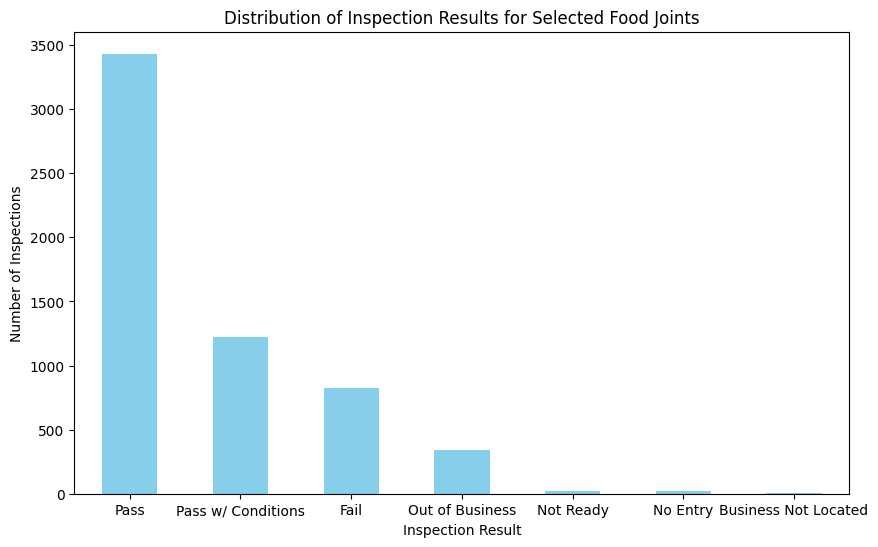

In [ ]:
inspection_results = filtered_data['Results'].value_counts()

# Plotting
inspection_results.plot(kind='bar', figsize=(10, 6), color='skyblue')
plt.title('Distribution of Inspection Results for Selected Food Joints')
plt.xlabel('Inspection Result')
plt.ylabel('Number of Inspections')
plt.xticks(rotation=0)
plt.show()

### **How do inspection results vary across the selected food joints?**

The filtered data is split into separate DataFrames for each food joint (Burger King, Subway, Domino's, and Chipotle) by applying additional filtering based on the DBA Name. A stacked bar chart is plotted to visualize the inspection results across the selected food joints. Each inspection result is represented in different colors for easy comparison. This approach provides a clear visual breakdown of how inspection results vary across the four targeted food joints. It allows the agency to easily identify which brands might need attention based on their compliance with health and safety regulations. Be sure to adjust any specifics based on your dataset's actual schema and requirements!

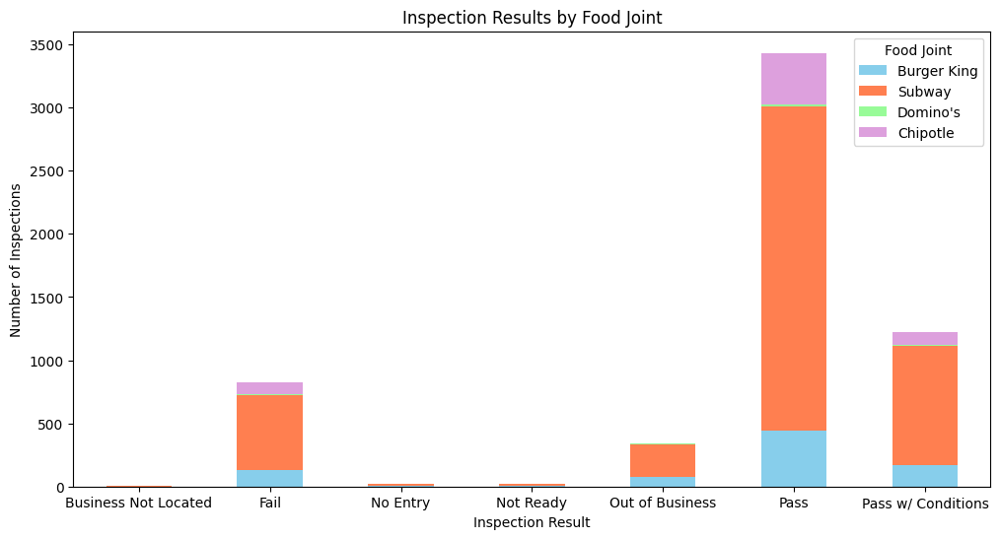

In [ ]:
burger_king = filtered_data[filtered_data['DBA Name'].str.contains('BURGER KING', case=False, na=False)]
subway = filtered_data[filtered_data['DBA Name'].str.contains('SUBWAY', case=False, na=False)]
dominos = filtered_data[filtered_data['DBA Name'].str.contains('DOMINOS', case=False, na=False)]
chipotle = filtered_data[filtered_data['DBA Name'].str.contains('CHIPOTLE', case=False, na=False)]

results_burger_king = burger_king['Results'].value_counts()
results_subway = subway['Results'].value_counts()
results_dominos = dominos['Results'].value_counts()
results_chipotle = chipotle['Results'].value_counts()

results_combined = pd.DataFrame({
    'Burger King': results_burger_king,
    'Subway': results_subway,
    'Domino\'s': results_dominos,
    'Chipotle': results_chipotle
}).fillna(0)

results_combined.plot(kind='bar', stacked=True, figsize=(12, 6), color=['skyblue', 'coral', 'palegreen', 'plum'])
plt.title('Inspection Results by Food Joint')
plt.xlabel('Inspection Result')
plt.ylabel('Number of Inspections')
plt.legend(title='Food Joint')
plt.xticks(rotation=0)
plt.show()

### **How are different types of inspections distributed geographically for the selected food joints?**

By plotting the locations of businesses and their inspection results on a map, you can identify geographic trends and patterns. For instance, certain areas may have a higher concentration of businesses failing inspections. The analysis reveals how many businesses pass, fail, or are out of business based on inspection results. This offers insights into overall performance and compliance in various regions. The findings can assist businesses in identifying areas for improvement. For instance, if a specific type of establishment (e.g., restaurants) frequently fails inspections in certain neighborhoods, it may indicate a need for better training or compliance measures.

In [ ]:
map_center = [filtered_data['Latitude'].mean(), filtered_data['Longitude'].mean()]
inspection_map = folium.Map(location=map_center, zoom_start=12)

for _, row in filtered_data.iterrows():
    if row['Results'] == 'Pass':
        icon_color = 'green'
    elif row['Results'] == 'Fail':
        icon_color = 'red'
    elif row['Results'] == 'Out of business':
        icon_color = 'orange'
    else:
        icon_color = 'lightblue'

    folium.Marker(
        location=(row['Latitude'], row['Longitude']),
        popup=f"{row['DBA Name']}: {row['Inspection Type']}",
        icon=folium.Icon(color=icon_color)
    ).add_to(inspection_map)

inspection_map.save('inspection_map.html')

In [ ]:
inspection_map

### **What is the distribution of Results from different inspection types?**

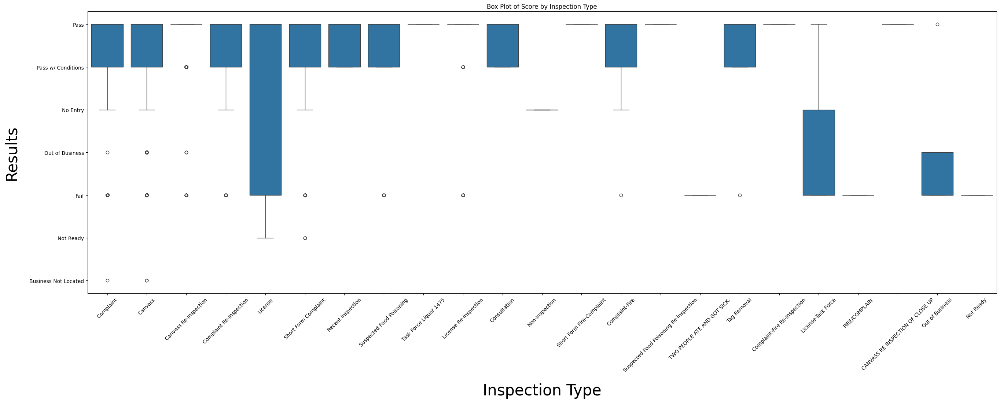

In [ ]:
plt.figure(figsize=(32, 10))
sns.boxplot(x='Inspection Type', y='Results', data=filtered_data)
plt.title('Box Plot of Score by Inspection Type')
plt.xlabel('Inspection Type', fontsize=30, labelpad=20)
plt.ylabel('Results', fontsize=30, labelpad=20)
plt.xticks(rotation=45)
plt.show()

### **How do inspection results vary across different risk classifications?**

The stack of bar segments representing various outcomes (e.g., Pass, Fail, Out of business) gives a clear view of overall inspection performance for different risk classifications. This insight allows for assessing the effectiveness of current processes. By looking at which risk classifications have higher failure rates or are out of business, the business can identify high-risk areas that may require additional oversight or intervention. This helps prioritize resource allocation for inspections or interventions. Businesses can strive for operational excellence by reducing failure rates, which not only reinforces brand reputation but can also lead to cost savings and efficiency improvement.

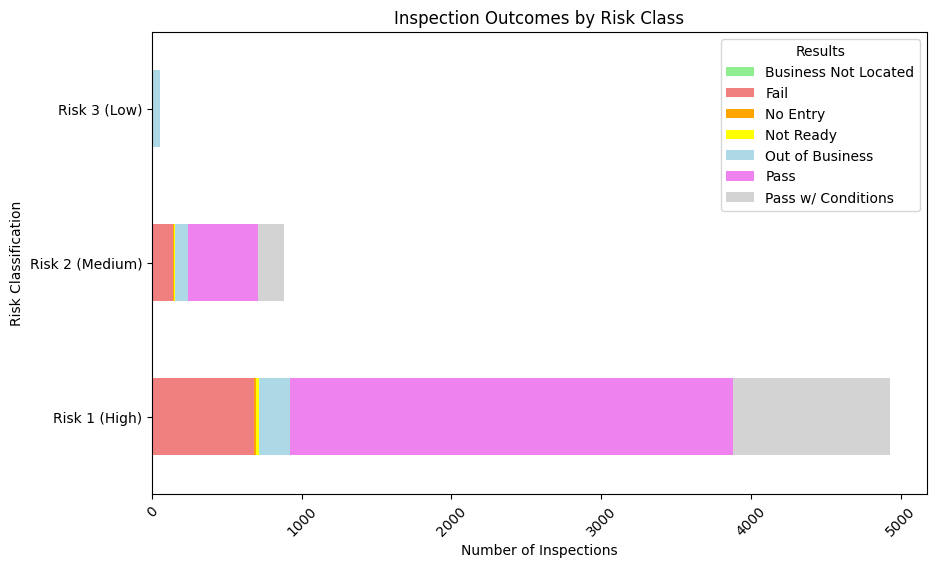

In [ ]:
risk_results = filtered_data.groupby(['Risk', 'Results']).size().unstack(fill_value=0)
risk_results.plot(kind='barh', stacked=True, figsize=(10, 6), color=['lightgreen', 'lightcoral', 'orange', 'yellow', 'lightblue', 'violet', 'lightgrey'])
plt.title('Inspection Outcomes by Risk Class')
plt.xlabel('Number of Inspections')
plt.ylabel('Risk Classification')
plt.legend(title='Results')
plt.xticks(rotation=45)
plt.show()

### **How has the frequency of different inspection types changed over time?**

The line plot visually represents how different inspection results have trended over the years. Each line corresponds to a specific result category, allowing viewers to easily identify trends (increases or decreases) over time. The plot can highlight cyclical patterns, spikes, or downturns in certain results. For instance, a spike in "Warnings" may correlate with specific policy changes or external factors impacting compliance. The analysis can highlight areas of concern regarding compliance. As trend indicates a consistent decrease in pass condition, the business can proactively address compliance issues to avoid penalties or further complications.

<ipython-input-17-8da94528831c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Inspection Date'] = pd.to_datetime(filtered_data['Inspection Date'])
<ipython-input-17-8da94528831c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Year'] = filtered_data['Inspection Date'].dt.year


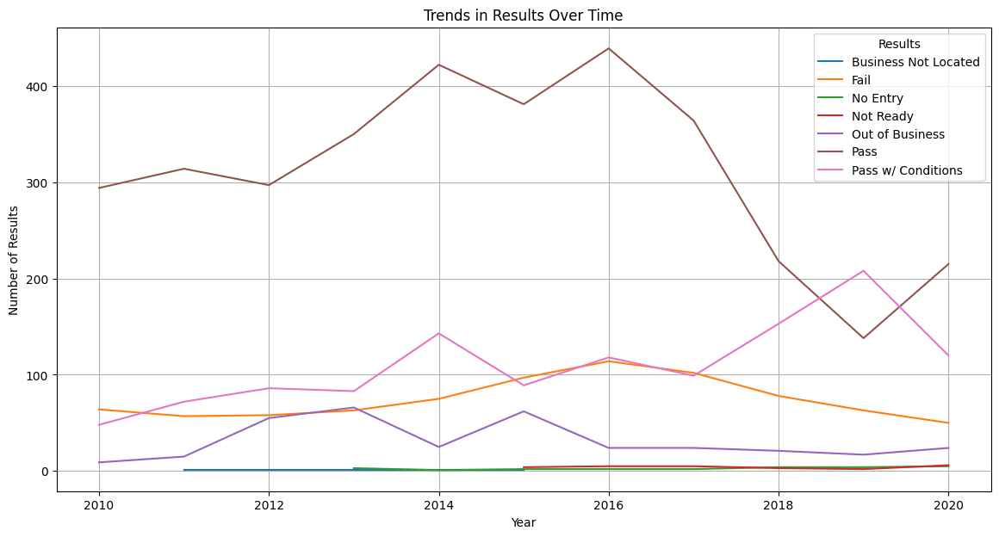

In [ ]:
filtered_data['Inspection Date'] = pd.to_datetime(filtered_data['Inspection Date'])
filtered_data['Year'] = filtered_data['Inspection Date'].dt.year
inspection_trends = filtered_data.groupby(['Year', 'Results']).size().reset_index(name='Count')

plt.figure(figsize=(14, 7))
for key, grp in inspection_trends.groupby('Results'):
    plt.plot(grp['Year'], grp['Count'], label=key)
plt.title('Trends in Results Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Results')
plt.legend(title='Results')
plt.grid()
plt.show()

### **Final Business Conclusions:**

*Performance Benchmarking:*

The inspection outcome analysis allows the business to identify baseline performance metrics across different risk classifications. This can help in setting measurable performance benchmarks and targets for future inspections.

*Understanding Risk Classifications:*

The analysis has revealed which specific risk classifications have higher failure rates or concerning trends. This insight enables the business to target interventions more effectively in high-risk areas, thereby reducing operational risk and potential liabilities.

*Trend Identification:*

The trend analysis highlighted significant changes in inspection outcomes over the years, such as increasing failures or consistent compliance issues. Recognizing these patterns provides a clearer picture of long-term performance and helps inform strategic planning.


### **Overall Analysis Summary:**

The amalgamation of these analyses has culminated in a detailed understanding of inspection outcomes, performance trends, and risk factors that impact the organization. Key areas of focus include improving compliance and performance in specific risk classes, strategically allocating resources, and enhancing overall operational efficiency. The ability to synthesize and act upon these insights positions the business for ongoing improvement and success in navigating the complexities of its operational landscape.

This final conclusion provides a clear roadmap for future actions that the business can take to ensure adherence to compliance standards, optimize inspection processes, and enhance overall operational resilience.